In [2]:
# add parent folder path where lib folder is
path = r'K:\cartilage_project'
import sys; sys.path.insert(0, path) 
import pickle
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.pylab as pl
import numpy as np
import os
import torch
import scipy.io as sio
import random
from sklearn.decomposition import PCA
from mpl_toolkits.axes_grid1 import ImageGrid
from scipy import stats
from loaders import cell_data_loaders
from scipy import signal
from matplotlib import cm, colors
import statsmodels.api as sm

font = { 'size'   : 15}
matplotlib.rc('font', **font)


# Load data

In [57]:
# Cartilage data
expr_date = ['22_04_28','22_04_29','22_04_21']

'''
Load cell data
'''
loc_x = {}
loc_y = {}
im_loc_x = {}
im_loc_y = {}
impact_intensity = {}
cell = {}
for expr in expr_date :
    # location of cells 
    location=r'all_locs.mat'
    locs=sio.loadmat(os.path.join(path,expr,location))['all_locs']
    loc_x[expr] =locs[:,0]
    loc_y[expr] =locs[:,1]
    
    # load cell data 
    file_name_r=r'red_all.mat'
    file_name_g=r'green_all.mat'
    file_name_b=r'blue_all.mat'
    R=sio.loadmat(os.path.join(path,expr,file_name_r))['red_all']
    G=sio.loadmat(os.path.join(path,expr,file_name_g))['green_all']
    B=sio.loadmat(os.path.join(path,expr,file_name_b))['blue_all']
    R = signal.resample(R,750).T
    G = signal.resample(G,750).T
    B = signal.resample(B,750).T
    N = R.shape[0]
    L = R.shape[1]
    cell[expr] = np.zeros((N,3,L))
    for i in range(N):
        cell[expr][i,0,:] = R[i,:]
        cell[expr][i,1,:] = G[i,:]
        cell[expr][i,2,:] = B[i,:]

    #load impact intensity
    
    impact_location=r'impact_locs.mat'
    im_locs=sio.loadmat(os.path.join(path,expr,impact_location))['impact_locs']
    im_loc_x[expr]=im_locs[:,0]
    im_loc_y[expr]=im_locs[:,1]
    
    impact_name = r'impact_intensity'
    impact_intensity[expr] = sio.loadmat(os.path.join(path,expr,impact_name))['impact_intensity']
    impact_intensity[expr] = signal.resample(impact_intensity[expr],750).T


In [58]:
# cell indices 
cell_date_ind = np.cumsum([0,7726,8713,7664])
impact_date_ind = np.cumsum([0,1175, 1871, 1632])

# load cell data and impact data into loaders for training 
cell_all = np.concatenate([cell[expr] for expr in expr_date],0)
cell_all = torch.Tensor(cell_all)

impact_all = np.concatenate([impact_intensity[expr] for expr in expr_date],0)
impact_all = torch.Tensor(impact_all)

cell_loaders=cell_data_loaders(cell_all,split=0.8,batch_size=32, shuffle=True, num_workers=0)


# Helper functions

In [5]:
'''
Agglomerative clustering 
'''

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts])

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

# First hypothesis - Impact Curve 

Grab cells within impact site

(-604.1805349985057, 1629.2578276395589, -50.2025079051206, 1054.2526660075325)

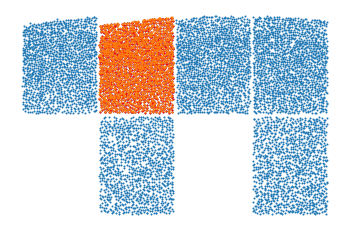

In [134]:
m=1
expr = expr_date[m]
start_idx=cell_date_ind[m]
end_idx=cell_date_ind[m+1]
impact_start_idx=impact_date_ind[m]
impact_end_idx=impact_date_ind[m+1]

condx = np.logical_and(loc_x[expr]>10,loc_x[expr]<505);
cond = np.logical_and(condx,max(loc_y[expr])-loc_y[expr]>510);

# plot to check
plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],s=1)
plt.scatter(loc_x[expr][cond1],max(loc_y[expr])-loc_y[expr][cond1],s=1,c='r')
plt.scatter(im_loc_x[expr],max(im_loc_y[expr])-im_loc_y[expr]+518,s=1)
plt.axis('off')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

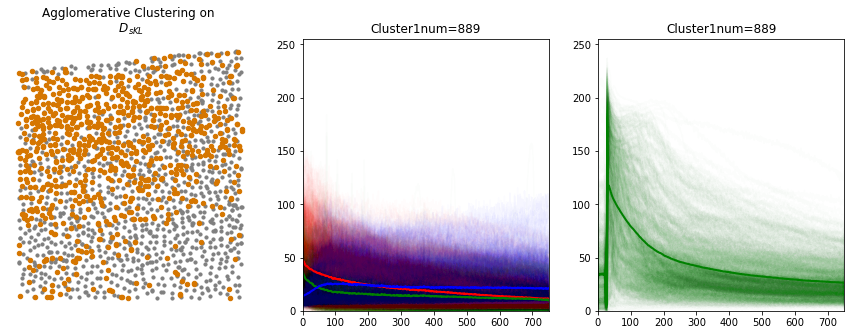

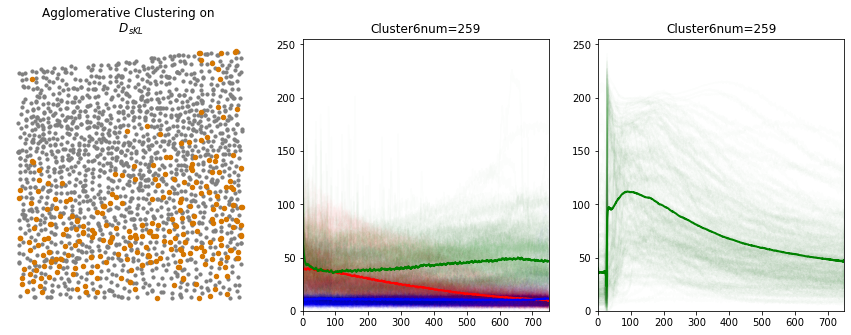

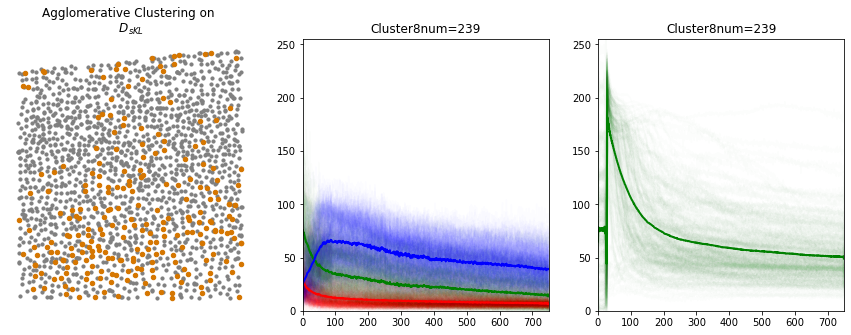

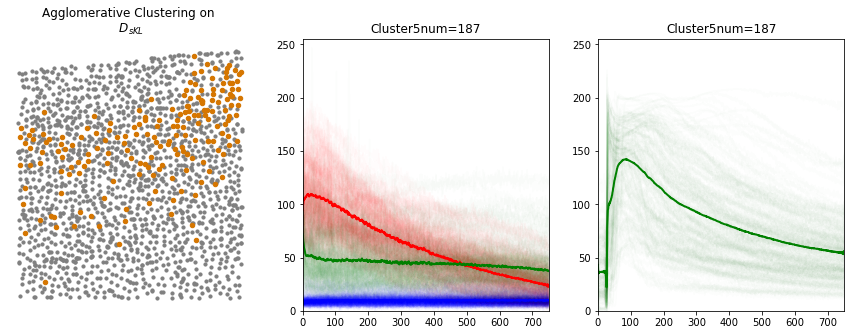

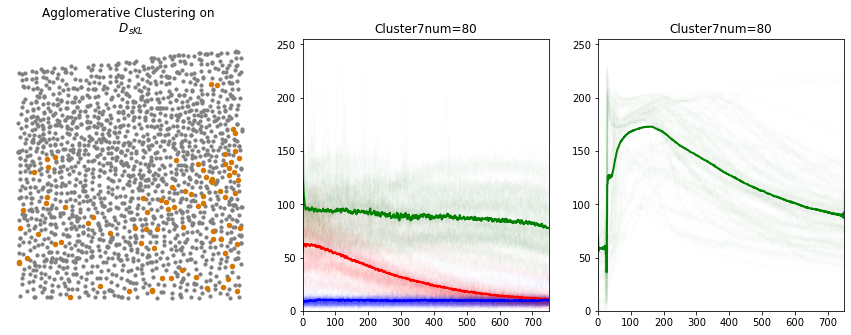

...

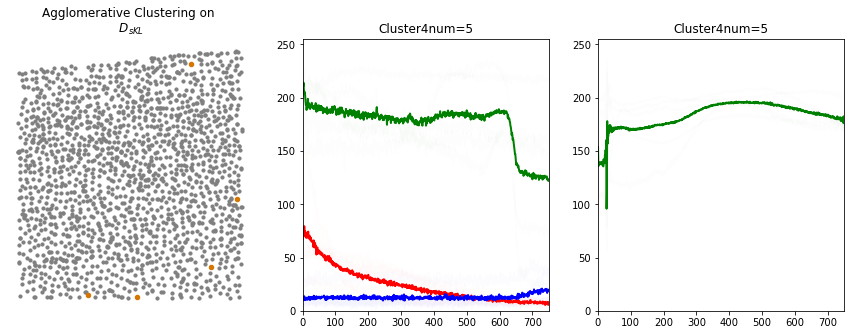

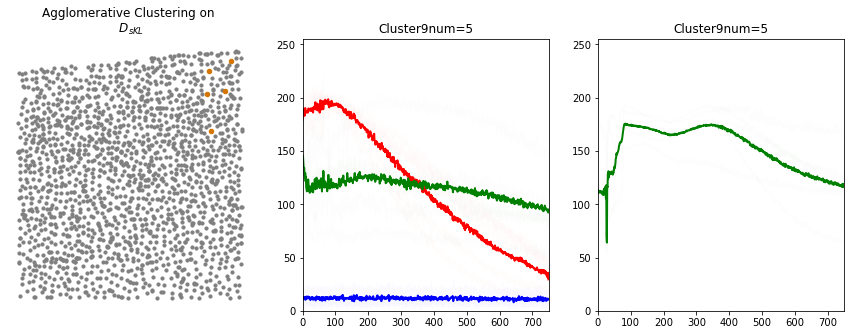

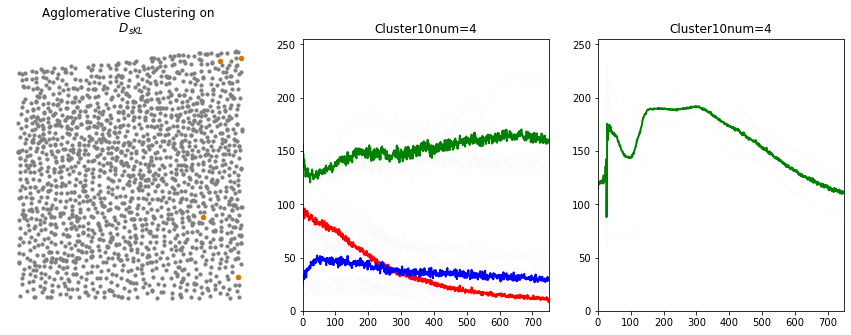

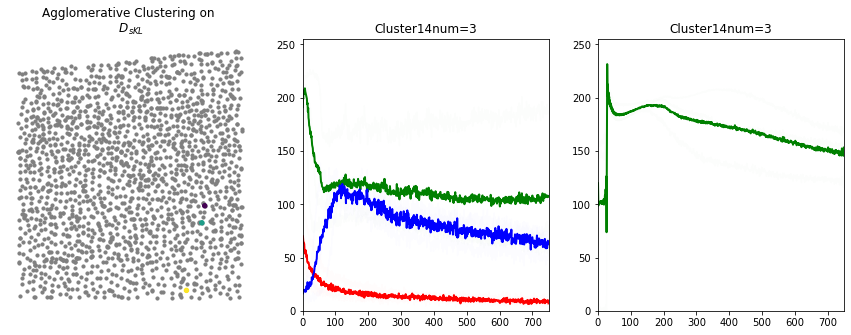

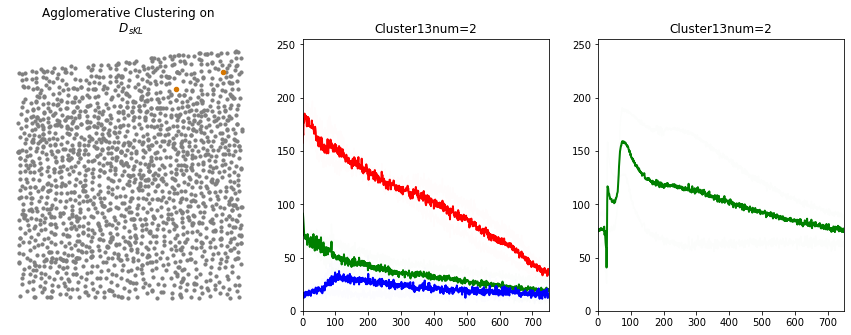

In [14]:
# load precalculated Dskl distance matrix
D = pickle.load(open(os.path.join(r'K:\cartilage_project\March28','D_skl_'+expr_date[m]+'.p'),'rb'))
# perform agglomerative clustering
clustering = AgglomerativeClustering(n_clusters = 15,distance_threshold=None,linkage='complete',affinity ='precomputed').fit(D[cond][:,cond])
# reorder indices 
num_cell_in_cluster = [-sum(clustering.labels_==i) for i in range(clustering.n_clusters_)]
sort_ind = np.argsort(num_cell_in_cluster)

for count,cluster_ in enumerate(sort_ind):
    
    cluster_ind=list(np.where(clustering.labels_==cluster_))[0]

    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.scatter(loc_x[expr][cond],max(loc_y[expr][cond])-loc_y[expr][cond],c='gray',s=10)
    ind=np.where(clustering.labels_==cluster_)[0]
    plt.scatter(loc_x[expr][cond][ind],max(loc_y[expr][cond])-loc_y[expr][cond][ind],c=[214/255,118/255,0/255],s=20)
    plt.title('Agglomerative Clustering on \n $D_{sKL}$ ')
    #plt.axis([0,510,510,1020])
    plt.axis('off')

    plt.subplot(1,3,2)
    for i in cluster_ind:

        plt.plot(cell_all[start_idx+np.where(cond)[0][i],0,:],'r',alpha=0.01)
        plt.plot(cell_all[start_idx+np.where(cond)[0][i],1,:],'g',alpha=0.01)
        plt.plot(cell_all[start_idx+np.where(cond)[0][i],2,:],'b',alpha=0.01)

    plt.title('Cluster'+str(cluster_)+'num='+str(len(cluster_ind)))
    plt.plot(torch.mean(cell_all[start_idx+np.where(cond)[0][cluster_ind],0,:],0),'r-',linewidth=2)
    plt.plot(torch.mean(cell_all[start_idx+np.where(cond)[0][cluster_ind],1,:],0),'g-',linewidth=2)
    plt.plot(torch.mean(cell_all[start_idx+np.where(cond)[0][cluster_ind],2,:],0),'b-',linewidth=2)
    plt.axis([0,750,0,255])
    plt.subplot(1,3,3)
    for i in cluster_ind:

        plt.plot(impact_all[impact_start_idx+np.where(cond)[0][i],:],'g',alpha=0.01)
        
    plt.title('Cluster'+str(cluster_)+'num='+str(len(cluster_ind)))
    plt.axis([0,750,0,255])
    plt.plot(torch.mean(impact_all[impact_start_idx+np.where(cond)[0][cluster_ind],:],0),'g-',linewidth=2)


# Group cells based on NMP
ii_  =[]
for i in [1,8,11,3,2,12,14]:
    ii_+=list(np.where(clustering.labels_==i)[0])


ii_f  =[]
for i in [6,5,7,4,9,10,13]:
    ii_f+=list(np.where(clustering.labels_==i)[0])
    

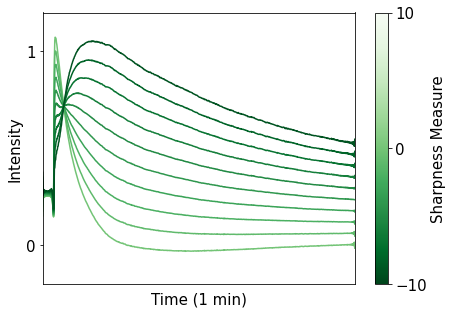

In [62]:
# Sharpness measure
impact_sub = impact_all[impact_start_idx:impact_end_idx]
impact_sub/=torch.max(impact_sub,axis=1).values.reshape([-1,1])
pca = PCA(n_components=1)
pca.fit(impact_sub)
embedding_impact_pca = pca.transform(impact_sub)

sample_pts= np.linspace(-10,10,10).reshape([-1,1])

inv_transformed_points = pca.inverse_transform(sample_pts)

cmap = cm.get_cmap("Greens")
norm = colors.Normalize(-10, 10)

fig, ax = plt.subplots(figsize=(7,5))
for i in range(10):
    ax.plot(inv_transformed_points[i],c=cmap(norm(i)))

cmap = cm.get_cmap("Greens_r")
norm = colors.Normalize(-10, 10)
plt.axis([0,750,-0.2,1.2])
plt.xticks([])
plt.yticks([0,1])
plt.xlabel('Time (1 min)')
plt.ylabel('Intensity')
fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax,label = 'Sharpness Measure',ticks=[-10, 0, 10])


KstestResult(statistic=0.5237137034422242, pvalue=2.220446049250313e-15)

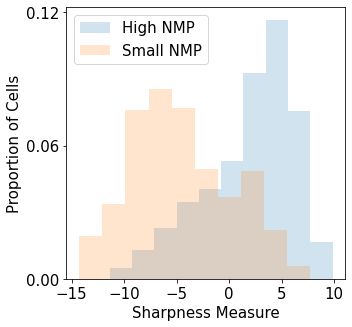

In [63]:


plt.figure(figsize=(5,5))
plt.hist(-embedding_impact_pca[ii_],alpha=0.2,density=True,label = 'High NMP')
plt.hist(-embedding_impact_pca[ii_f],alpha=0.2,density=True,label = 'Small NMP')
plt.legend()
plt.yticks([0,0.06,0.12])
plt.ylabel('Proportion of Cells')
plt.xlabel('Sharpness Measure')

stats.ks_2samp(embedding_impact_pca[ii_].flatten(), embedding_impact_pca[ii_f].flatten())



# Second Hypothesis - Delayed NMP

Experiment data 1

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

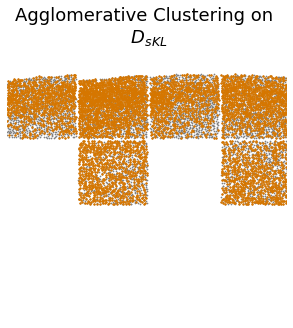

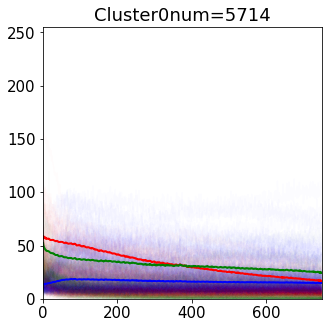

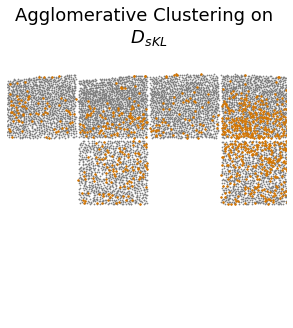

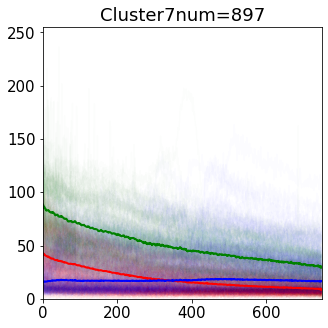

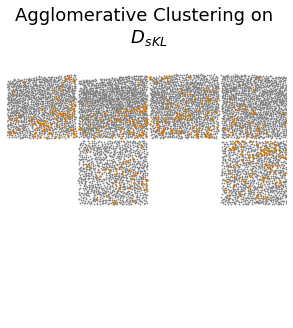

...

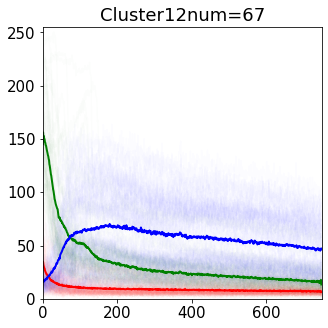

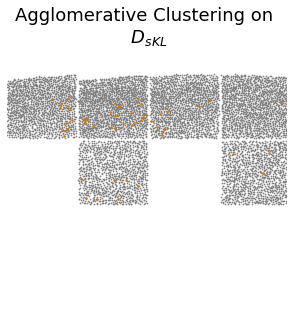

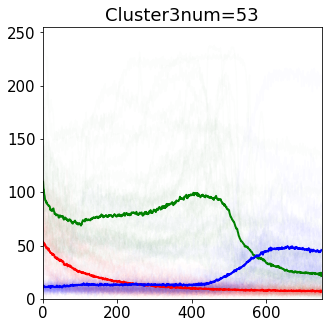

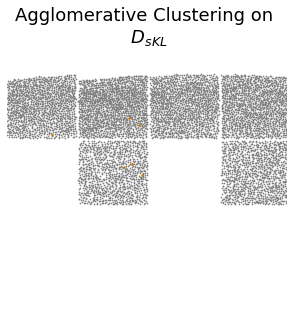

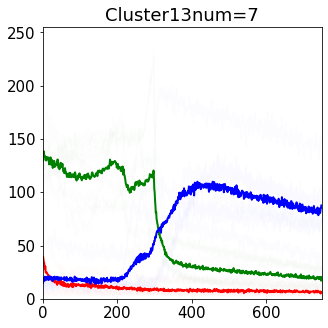

In [135]:

m=1
D = pickle.load(open(os.path.join(r'K:\cartilage_project\March28','D_skl_'+expr_date[m]+'.p'),'rb'))
expr =  expr_date[m]

clustering = AgglomerativeClustering(n_clusters = 14,distance_threshold=None,linkage='complete',affinity ='precomputed').fit(D)
# reorder indices 
num_cell_in_cluster = [-sum(clustering.labels_==i) for i in range(clustering.n_clusters_)]
sort_ind = np.argsort(num_cell_in_cluster)

cluster_indices = {}
for count,cluster_ in enumerate(sort_ind):
   
    cluster_ind=list(np.where(clustering.labels_==cluster_))[0]

    plt.figure(figsize=(5,5))
    plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=.5)
    ind=np.where(clustering.labels_==cluster_)[0]
    cluster_indices['ncluster_'+str(count)] = ind
    plt.scatter(loc_x[expr][ind],max(loc_y[expr])-loc_y[expr][ind],c=[214/255,118/255,0/255],s=2)
    plt.title('Agglomerative Clustering on \n $D_{sKL}$ ')
    plt.axis([-500,1500,-900,1200])
    plt.axis('off')
   
    plt.figure(figsize=(5,5))
    for i in cluster_ind[:200]:

        plt.plot(cell_all[start_idx+i,0,:],'r',alpha=0.01)
        plt.plot(cell_all[start_idx+i,1,:],'g',alpha=0.01)
        plt.plot(cell_all[start_idx+i,2,:],'b',alpha=0.01)
        
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,0,:],0),'r-',linewidth=2)
    plt.title('Cluster'+str(cluster_)+'num='+str(len(cluster_ind)))
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,1,:],0),'g-',linewidth=2)
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,2,:],0),'b-',linewidth=2)
    plt.axis([0,750,0,255])


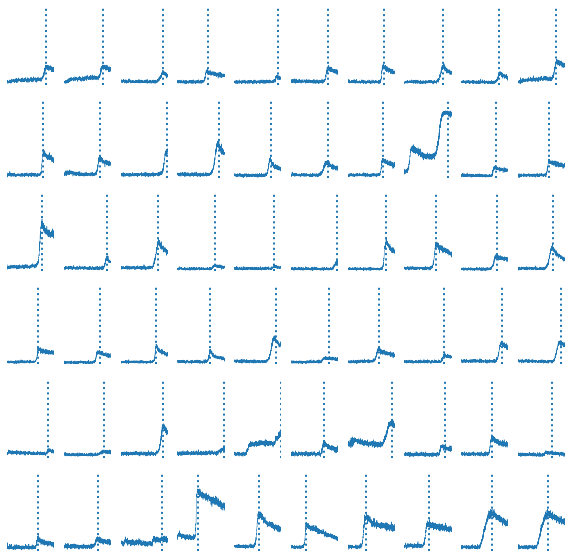

In [136]:
# estimate the onset time of NMP
delayed_cell_ind = []
for i in [3,13]:
    delayed_cell_ind += list(np.where(clustering.labels_==i)[0])
## estimate time death 
t_NMP = np.zeros((len(delayed_cell_ind),))
for i in range(len(delayed_cell_ind)):
    t_NMP[i]= np.argmax(cell_all[start_idx+delayed_cell_ind[i],2,:])
# check estimation
plt.figure(figsize=(10,10))
for i in range(len(t_NMP)):
    plt.subplot(6,10,i+1)
    plt.plot(cell_all[start_idx+delayed_cell_ind[i],2,:],linewidth=0.5)
    plt.axvline(t_NMP[i],linewidth=2,linestyle=':')
    plt.axis([0,750,0,250])
    plt.axis('off')

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.019
Method:                 Least Squares   F-statistic:                 2.392e-05
Date:                Mon, 25 Sep 2023   Prob (F-statistic):              0.996
Time:                        14:57:47   Log-Likelihood:                -340.74
No. Observations:                  56   AIC:                             685.5
Df Residuals:                      54   BIC:                             689.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        577.9931     37.963     15.225      0.0

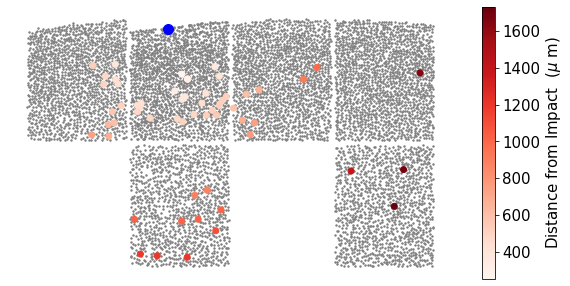

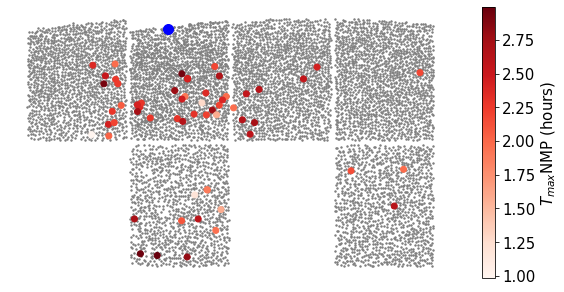

In [137]:
impact_loc_est_x=200
impact_loc_est_y=max(loc_y[expr])-50

locx_cell_delayed_death = loc_x[expr][delayed_cell_ind]
locy_cell_delayed_death = max(loc_y[expr])-loc_y[expr][delayed_cell_ind]

dist_from_impact = np.sqrt((locx_cell_delayed_death-impact_loc_est_x)**2+(locy_cell_delayed_death-impact_loc_est_y)**2)

ind_impact_ = locx_cell_delayed_death<1000


'''
Distance from impact plot
'''
plt.figure(figsize=(10,5))
plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=2)
plt.scatter(impact_loc_est_x,impact_loc_est_y,c='b',s=100)
plt.scatter(locx_cell_delayed_death,locy_cell_delayed_death,c=dist_from_impact*1.289,cmap='Reds')
plt.colorbar(label='Distance from Impact  ($\mu$ m)')
plt.axis('off')

'''
Distance from impact plot
'''
plt.figure(figsize=(10,5))
plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=2)
plt.scatter(impact_loc_est_x,impact_loc_est_y,c='b',s=100)
plt.scatter(locx_cell_delayed_death,locy_cell_delayed_death,c=t_NMP*3/750,cmap='Reds')
plt.colorbar(label='$T_{max}$NMP (hours)')
plt.axis('off')

'''
OLS Fit
'''

A = np.vstack([dist_from_impact[ind_impact_], np.ones(len(dist_from_impact[ind_impact_]))]).T
m_, c_ = np.linalg.lstsq(A, t_NMP[ind_impact_], rcond=None)[0]

d_consta=sm.add_constant(dist_from_impact[ind_impact_])
model = sm.OLS(t_NMP[ind_impact_], d_consta)
results = model.fit()
print(results.summary())


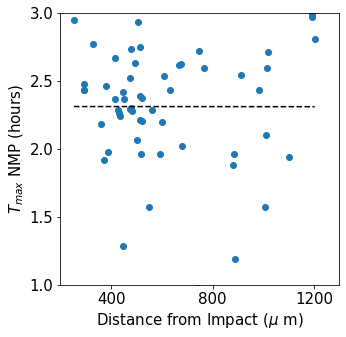

In [147]:

plt.figure(figsize=(5,5))
plt.scatter(dist_from_impact[ind_impact_]*1.289,t_NMP[ind_impact_]*3/750)
#plt.axhline(np.mean(t_NMP[ind_impact_]*3/750),0,1,linestyle='--',color='k')
plt.plot(np.sort(dist_from_impact[ind_impact_]*1.289),(m_*np.sort(dist_from_impact[ind_impact_])+c_)*3/750,'k--')
plt.xlabel('Distance from Impact ($\mu$ m)')
plt.ylabel('$T_{max}$ NMP (hours)')
plt.axis([200,1300,1,3]);
plt.xticks([400,800,1200]);
plt.yticks([1,1.5,2,2.5,3]);


Experiment data 2

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

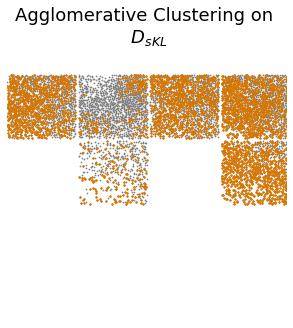

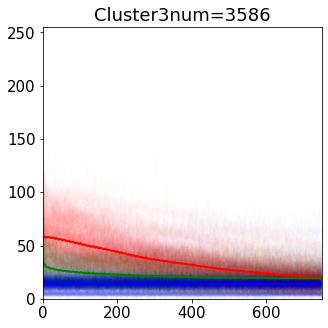

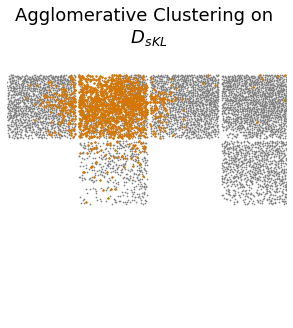

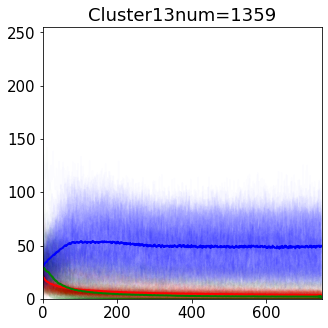

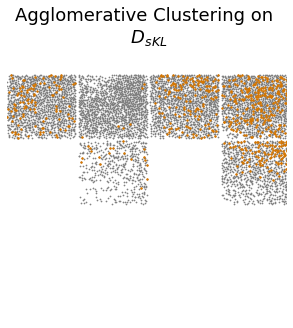

...

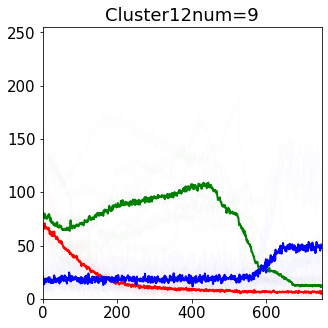

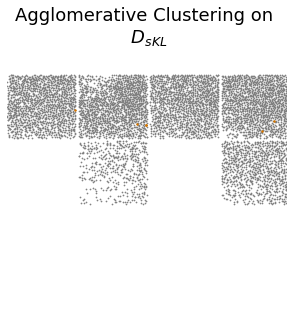

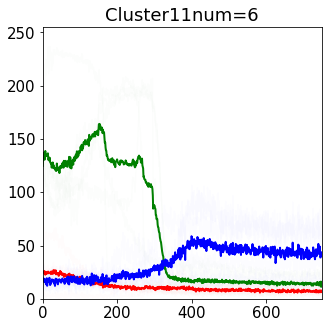

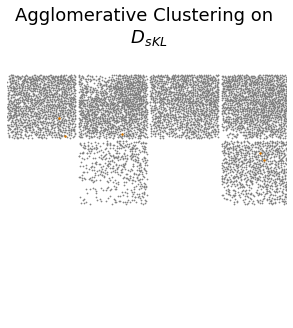

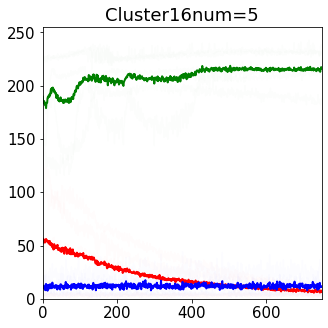

In [148]:
m=2
D = pickle.load(open(os.path.join(r'K:\cartilage_project\March28','D_skl_'+expr_date[m]+'.p'),'rb'))
expr =  expr_date[m]
start_idx=cell_date_ind[m]
clustering = AgglomerativeClustering(n_clusters = 20,distance_threshold=None,linkage='complete',affinity ='precomputed').fit(D)
# reorder indices 
num_cell_in_cluster = [-sum(clustering.labels_==i) for i in range(clustering.n_clusters_)]
sort_ind = np.argsort(num_cell_in_cluster)

cluster_indices = {}
for count,cluster_ in enumerate(sort_ind):
   
    cluster_ind=list(np.where(clustering.labels_==cluster_))[0]

    plt.figure(figsize=(5,5))
    plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=.5)
    ind=np.where(clustering.labels_==cluster_)[0]
    cluster_indices['ncluster_'+str(count)] = ind
    plt.scatter(loc_x[expr][ind],max(loc_y[expr])-loc_y[expr][ind],c=[214/255,118/255,0/255],s=2)
    plt.title('Agglomerative Clustering on \n $D_{sKL}$ ')
    plt.axis([-500,1500,-900,1200])
    plt.axis('off')
   
    plt.figure(figsize=(5,5))
    random.shuffle(cluster_ind)
    for i in cluster_ind[:200]:

        plt.plot(cell_all[start_idx+i,0,:],'r',alpha=0.01)
        plt.plot(cell_all[start_idx+i,1,:],'g',alpha=0.01)
        plt.plot(cell_all[start_idx+i,2,:],'b',alpha=0.01)
    
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,0,:],0),'r-',linewidth=2)
    plt.title('Cluster'+str(cluster_)+'num='+str(len(cluster_ind)))
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,1,:],0),'g-',linewidth=2)
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,2,:],0),'b-',linewidth=2)
    plt.axis([0,750,0,255])


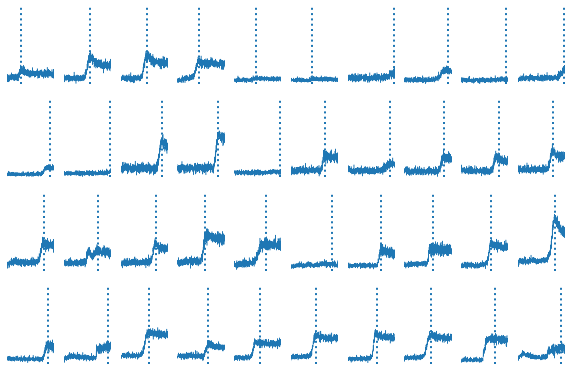

In [149]:
# estimate the onset time of NMP
delayed_cell_ind = []
for i in [11,12,15]:
    delayed_cell_ind += list(np.where(clustering.labels_==i)[0])
## estimate time death 
t_NMP = np.zeros((len(delayed_cell_ind),))
for i in range(len(delayed_cell_ind)):
    t_NMP[i]= np.argmax(signal.medfilt(cell_all[start_idx+delayed_cell_ind21[i],2,:],35))
# check estimation
plt.figure(figsize=(10,10))
for i in range(len(t_NMP)):
    plt.subplot(6,10,i+1)
    plt.plot(cell_all[start_idx+delayed_cell_ind[i],2,:],linewidth=0.5)
    plt.axvline(t_NMP[i],linewidth=2,linestyle=':')
    plt.axis([0,750,0,250])
    plt.axis('off')

In [150]:
# As we didnt fine tune the clustering threshold, clusters containing NMP might contain some stray points
to_exclude_ind = [4,5,6,8,11,14,25]
delayed_cell_ind = np.array([delayed_cell_ind[i] for i in range(len(delayed_cell_ind)) if i not in to_exclude_ind])
t_NMP = np.array([t_NMP[i] for i in range(len(t_NMP)) if i not in to_exclude_ind])

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.184
Date:                Mon, 25 Sep 2023   Prob (F-statistic):              0.285
Time:                        15:01:59   Log-Likelihood:                -203.31
No. Observations:                  33   AIC:                             410.6
Df Residuals:                      31   BIC:                             413.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        632.0742     91.340      6.920      0.0

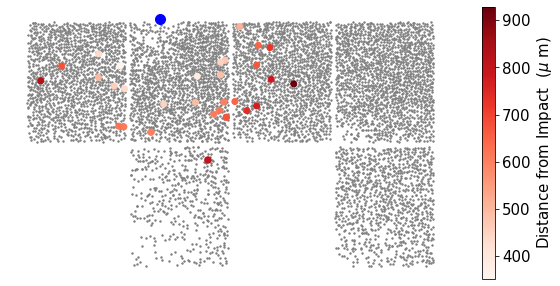

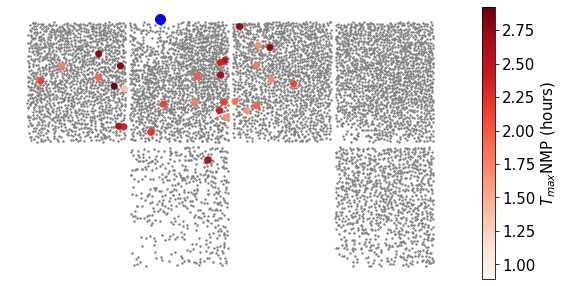

In [151]:
impact_loc_est_x=160
impact_loc_est_y=max(loc_y[expr])
    
locx_cell_delayed_death = loc_x[expr][delayed_cell_ind]
locy_cell_delayed_death = max(loc_y[expr])-loc_y[expr][delayed_cell_ind]

dist_from_impact = np.sqrt((locx_cell_delayed_death-impact_loc_est_x)**2+(locy_cell_delayed_death-impact_loc_est_y)**2)

ind_impact_ = locx_cell_delayed_death<1000


'''
Distance from impact plot
'''
plt.figure(figsize=(10,5))
plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=2)
plt.scatter(impact_loc_est_x,impact_loc_est_y,c='b',s=100)
plt.scatter(locx_cell_delayed_death,locy_cell_delayed_death,c=dist_from_impact*1.289,cmap='Reds')
plt.colorbar(label='Distance from Impact  ($\mu$ m)')
plt.axis('off')

'''
Distance from impact plot
'''
plt.figure(figsize=(10,5))
plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=2)
plt.scatter(impact_loc_est_x,impact_loc_est_y,c='b',s=100)
plt.scatter(locx_cell_delayed_death,locy_cell_delayed_death,c=t_NMP*3/750,cmap='Reds')
plt.colorbar(label='$T_{max}$NMP (hours)')
plt.axis('off')

'''
OLS Fit
'''

A = np.vstack([dist_from_impact[ind_impact_], np.ones(len(dist_from_impact[ind_impact_]))]).T
m_, c_ = np.linalg.lstsq(A, t_NMP[ind_impact_], rcond=None)[0]

d_consta=sm.add_constant(dist_from_impact[ind_impact_])
model = sm.OLS(t_NMP[ind_impact_], d_consta)
results = model.fit()
print(results.summary())


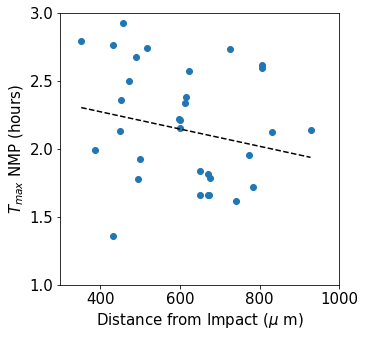

In [158]:

plt.figure(figsize=(5,5))
plt.scatter(dist_from_impact[ind_impact_]*1.289,t_NMP[ind_impact_]*3/750)
#plt.axhline(np.mean(t_NMP[ind_impact_]*3/750),0,1,linestyle='--',color='k')

plt.plot(np.sort(dist_from_impact[ind_impact_]*1.289),(m_*np.sort(dist_from_impact[ind_impact_])+c_)*3/750,'k--')
plt.xlabel('Distance from Impact ($\mu$ m)')
plt.ylabel('$T_{max}$ NMP (hours)')
plt.axis([300,1000,1,3]);
plt.xticks([400,600,800,1000]);
plt.yticks([1,1.5,2,2.5,3]);


# Hypothesis 3 - MT Polarization

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

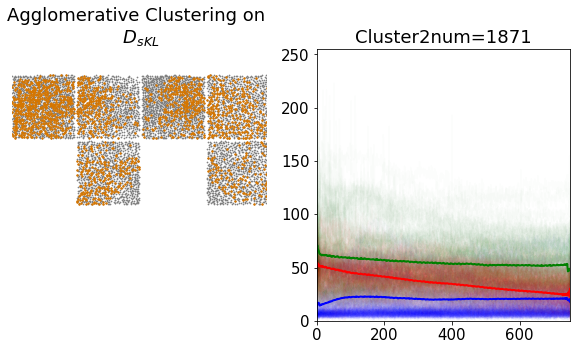

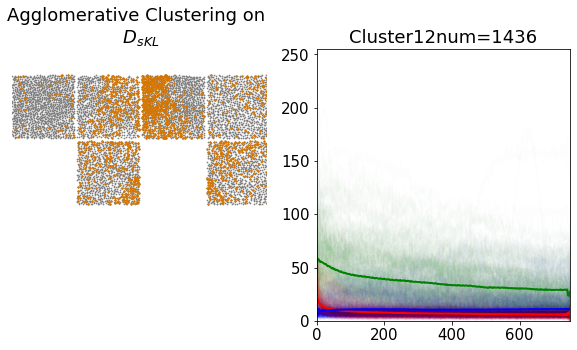

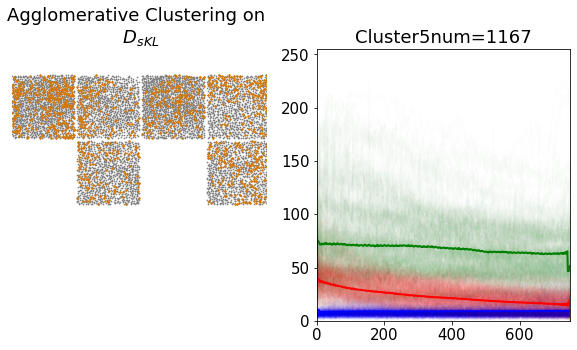

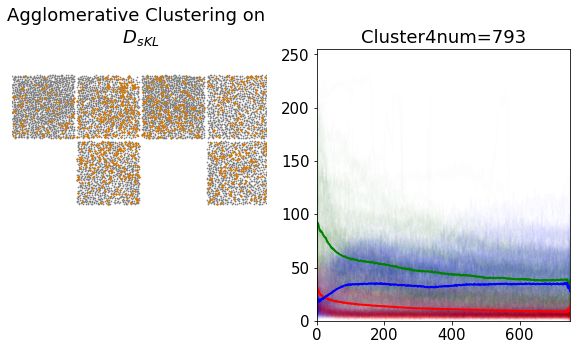

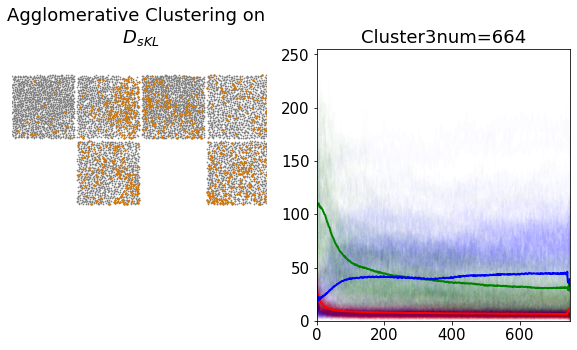

...

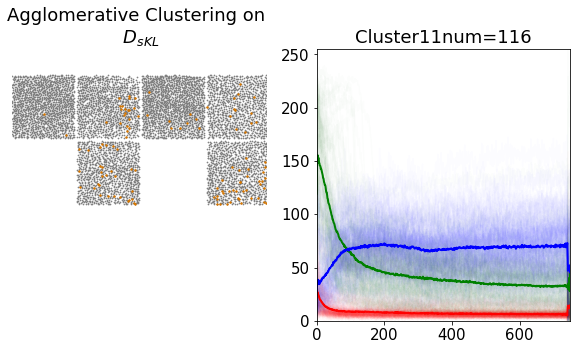

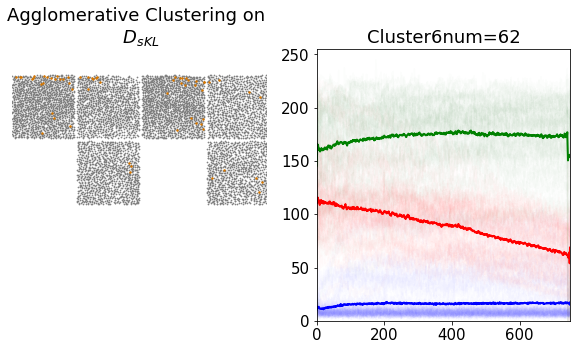

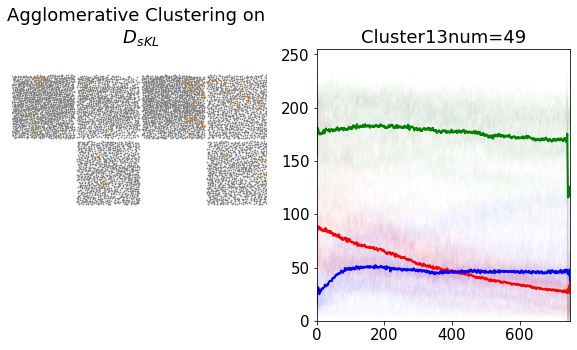

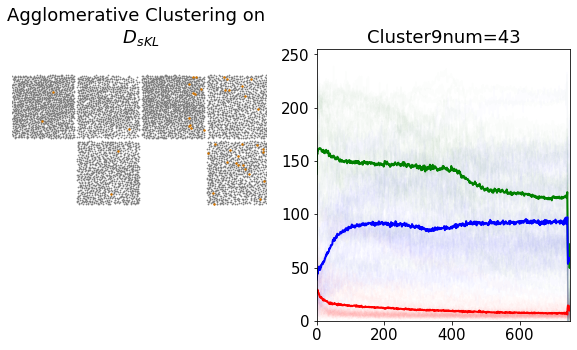

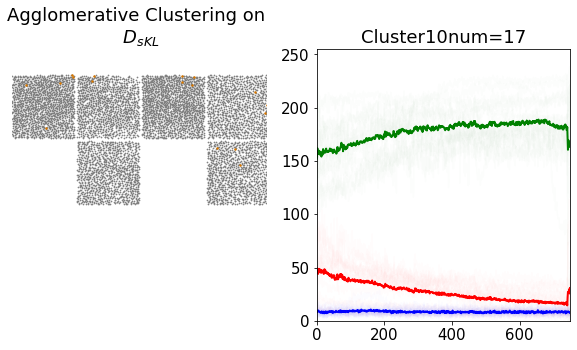

In [169]:
m=0
# grab data 
expr = expr_date[m]
start_idx=cell_date_ind[m]
end_idx=cell_date_ind[m+1]

D = pickle.load(open(os.path.join(r'K:\cartilage_project\March28','D_skl_'+expr_date[m]+'.p'),'rb'))
clustering = AgglomerativeClustering(n_clusters = 14,distance_threshold=None,linkage='complete',affinity ='precomputed').fit(D)

# reorder indices 
num_cell_in_cluster = [-sum(clustering.labels_==i) for i in range(clustering.n_clusters_)]
sort_ind = np.argsort(num_cell_in_cluster)

cluster_indices = {}
for count,cluster_ in enumerate(sort_ind):

    cluster_ind=list(np.where(clustering.labels_==cluster_))[0]

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=.5)
    ind=np.where(clustering.labels_==cluster_)[0]
    cluster_indices['ncluster_'+str(count)] = ind
    plt.scatter(loc_x[expr][ind],max(loc_y[expr])-loc_y[expr][ind],c=[214/255,118/255,0/255],s=2)
    plt.title('Agglomerative Clustering on \n $D_{sKL}$ ')
    plt.axis([-500,1500,-900,1200])
    plt.axis('off')
    plt.subplot(1,2,2)
    for i in cluster_ind[:200]:

        plt.plot(cell_all[start_idx+i,0,:],'r',alpha=0.01)
        plt.plot(cell_all[start_idx+i,1,:],'g',alpha=0.01)
        plt.plot(cell_all[start_idx+i,2,:],'b',alpha=0.01)

    plt.plot(th.mean(cell_all[start_idx+cluster_ind,0,:],0),'r-',linewidth=2)
    plt.title('Cluster'+str(cluster_)+'num='+str(len(cluster_ind)))
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,1,:],0),'g-',linewidth=2)
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,2,:],0),'b-',linewidth=2)
    plt.axis([0,750,0,255])


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

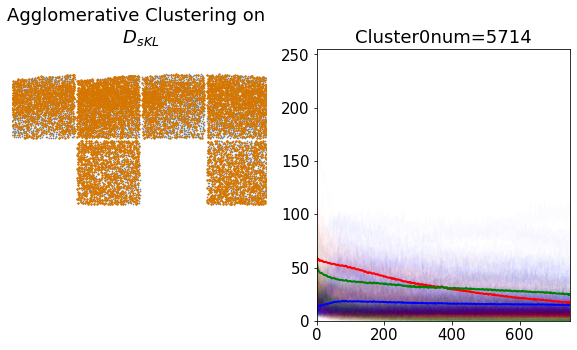

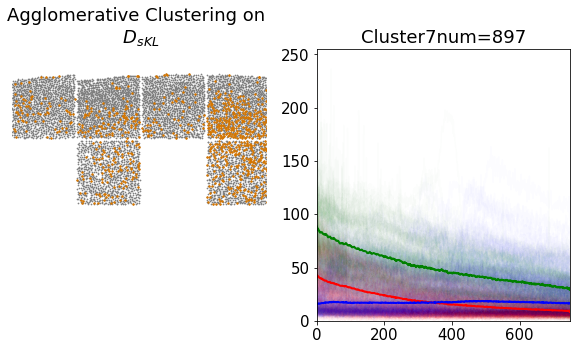

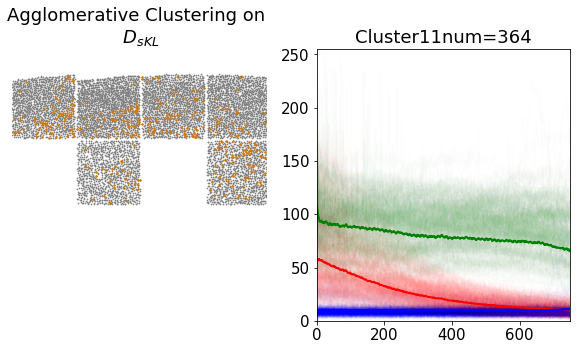

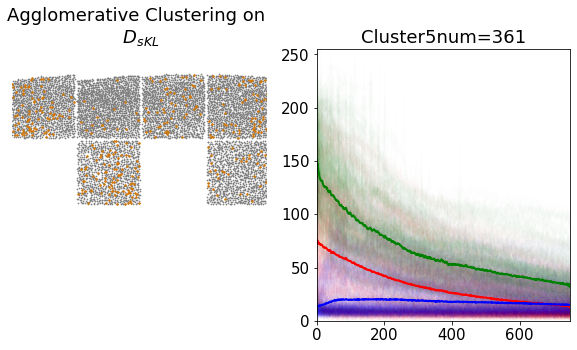

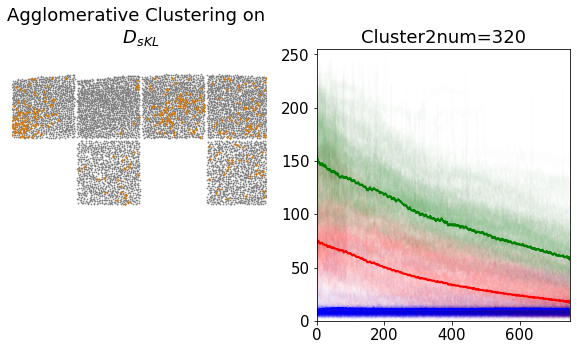

...

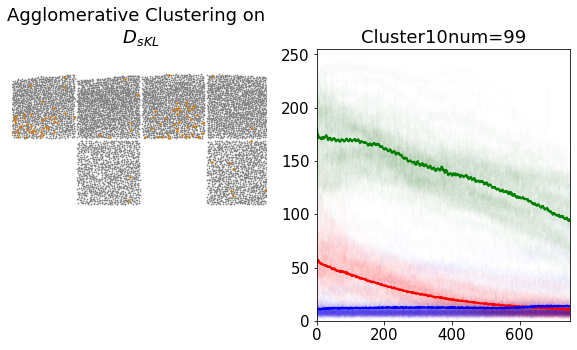

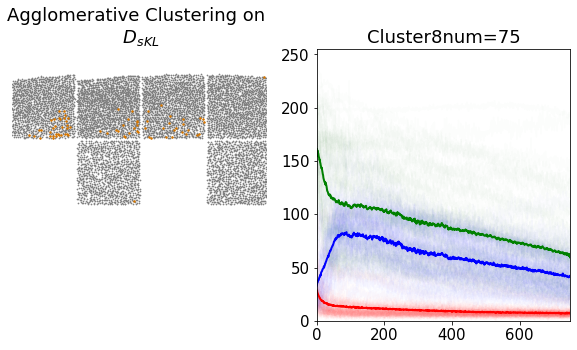

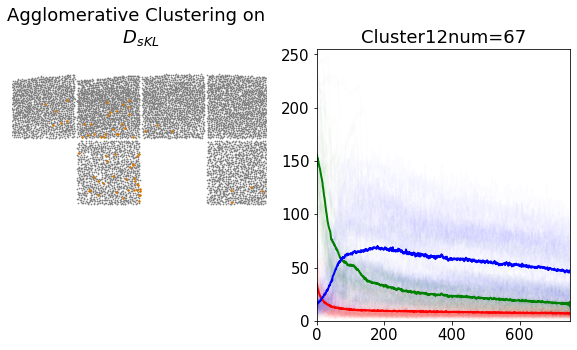

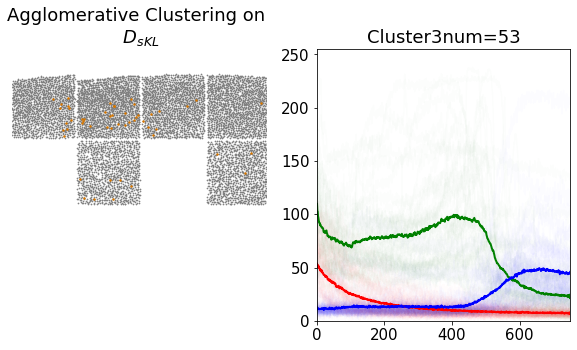

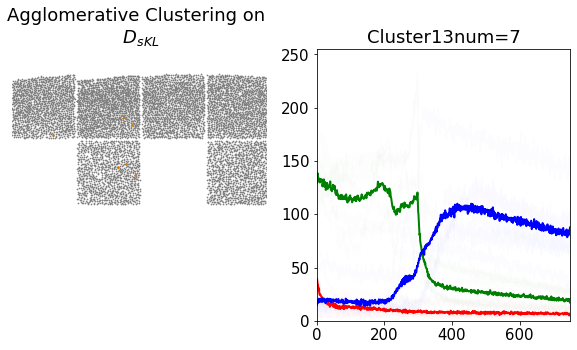

In [170]:
m=1
# grab data 
expr = expr_date[m]
start_idx=cell_date_ind[m]
end_idx=cell_date_ind[m+1]

D = pickle.load(open(os.path.join(r'K:\cartilage_project\March28','D_skl_'+expr_date[m]+'.p'),'rb'))
clustering = AgglomerativeClustering(n_clusters = 14,distance_threshold=None,linkage='complete',affinity ='precomputed').fit(D)

# reorder indices 
num_cell_in_cluster = [-sum(clustering.labels_==i) for i in range(clustering.n_clusters_)]
sort_ind = np.argsort(num_cell_in_cluster)

cluster_indices = {}
for count,cluster_ in enumerate(sort_ind):

    cluster_ind=list(np.where(clustering.labels_==cluster_))[0]

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=.5)
    ind=np.where(clustering.labels_==cluster_)[0]
    cluster_indices['ncluster_'+str(count)] = ind
    plt.scatter(loc_x[expr][ind],max(loc_y[expr])-loc_y[expr][ind],c=[214/255,118/255,0/255],s=2)
    plt.title('Agglomerative Clustering on \n $D_{sKL}$ ')
    plt.axis([-500,1500,-900,1200])
    plt.axis('off')
    plt.subplot(1,2,2)
    for i in cluster_ind[:200]:

        plt.plot(cell_all[start_idx+i,0,:],'r',alpha=0.01)
        plt.plot(cell_all[start_idx+i,1,:],'g',alpha=0.01)
        plt.plot(cell_all[start_idx+i,2,:],'b',alpha=0.01)

    plt.plot(th.mean(cell_all[start_idx+cluster_ind,0,:],0),'r-',linewidth=2)
    plt.title('Cluster'+str(cluster_)+'num='+str(len(cluster_ind)))
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,1,:],0),'g-',linewidth=2)
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,2,:],0),'b-',linewidth=2)
    plt.axis([0,750,0,255])


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

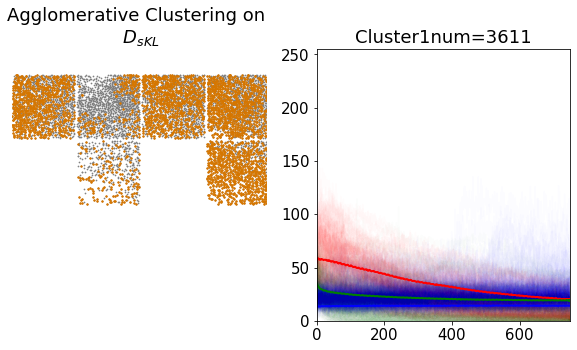

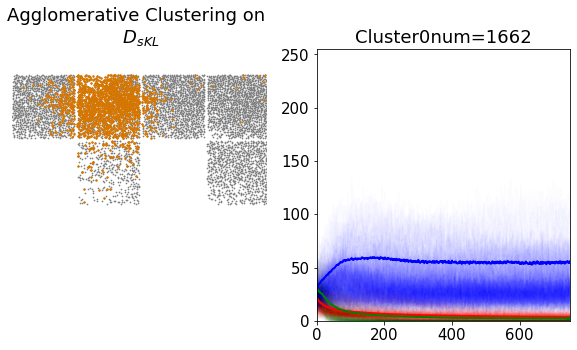

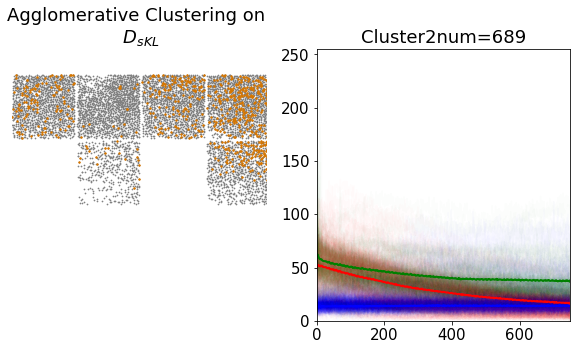

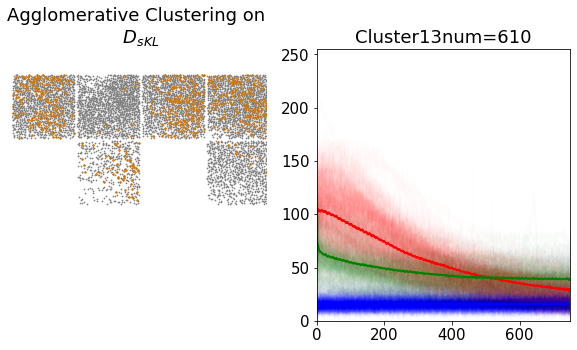

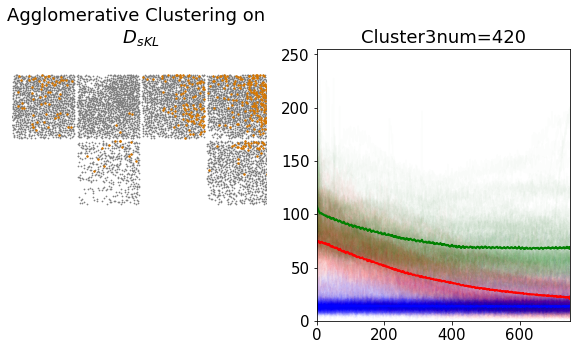

...

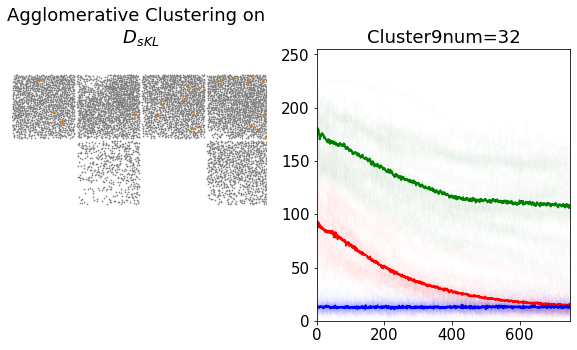

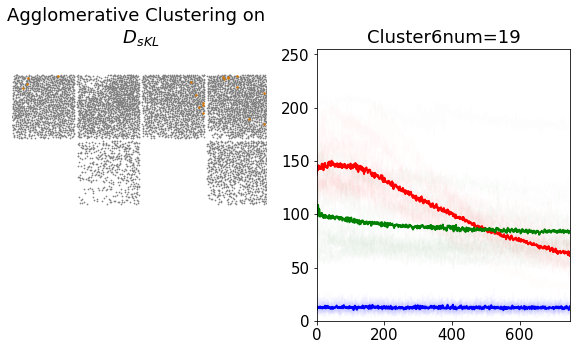

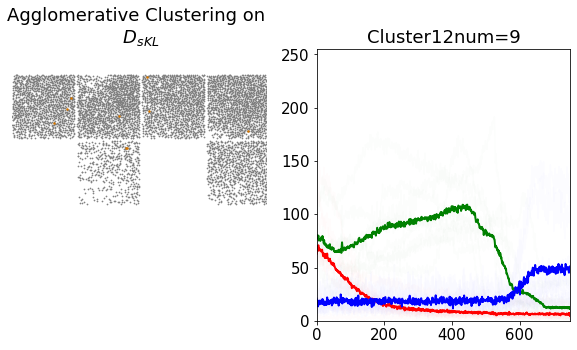

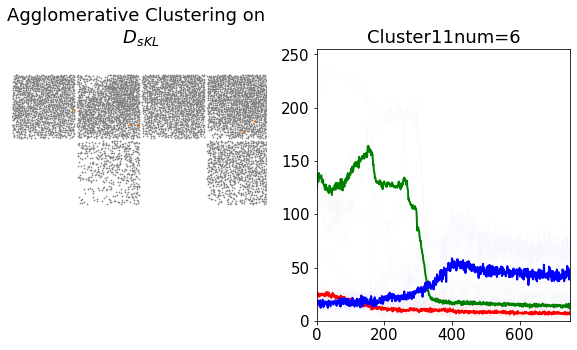

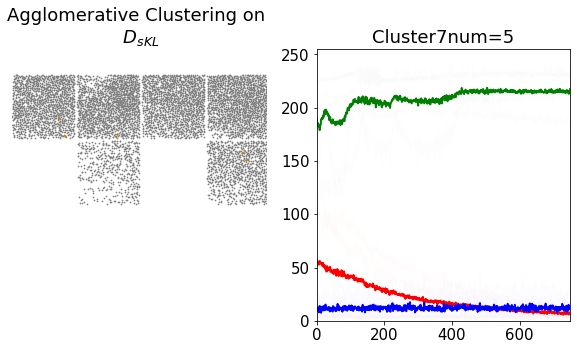

In [171]:
m=2
# grab data 
expr = expr_date[m]
start_idx=cell_date_ind[m]
end_idx=cell_date_ind[m+1]

D = pickle.load(open(os.path.join(r'K:\cartilage_project\March28','D_skl_'+expr_date[m]+'.p'),'rb'))
clustering = AgglomerativeClustering(n_clusters = 14,distance_threshold=None,linkage='complete',affinity ='precomputed').fit(D)

# reorder indices 
num_cell_in_cluster = [-sum(clustering.labels_==i) for i in range(clustering.n_clusters_)]
sort_ind = np.argsort(num_cell_in_cluster)

cluster_indices = {}
for count,cluster_ in enumerate(sort_ind):

    cluster_ind=list(np.where(clustering.labels_==cluster_))[0]

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.scatter(loc_x[expr],max(loc_y[expr])-loc_y[expr],c='gray',s=.5)
    ind=np.where(clustering.labels_==cluster_)[0]
    cluster_indices['ncluster_'+str(count)] = ind
    plt.scatter(loc_x[expr][ind],max(loc_y[expr])-loc_y[expr][ind],c=[214/255,118/255,0/255],s=2)
    plt.title('Agglomerative Clustering on \n $D_{sKL}$ ')
    plt.axis([-500,1500,-900,1200])
    plt.axis('off')
    plt.subplot(1,2,2)
    for i in cluster_ind[:200]:

        plt.plot(cell_all[start_idx+i,0,:],'r',alpha=0.01)
        plt.plot(cell_all[start_idx+i,1,:],'g',alpha=0.01)
        plt.plot(cell_all[start_idx+i,2,:],'b',alpha=0.01)

    plt.plot(th.mean(cell_all[start_idx+cluster_ind,0,:],0),'r-',linewidth=2)
    plt.title('Cluster'+str(cluster_)+'num='+str(len(cluster_ind)))
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,1,:],0),'g-',linewidth=2)
    plt.plot(th.mean(cell_all[start_idx+cluster_ind,2,:],0),'b-',linewidth=2)
    plt.axis([0,750,0,255])


In [53]:
MT_cell_inds ={}
MT_cell_inds[0] = [2, 5, 0, 8, 7, 1, 6, 13, 10 ]  
MT_cell_inds[1] = [0, 7, 11, 5, 2, 4, 6, 1, 10, 3 ]
MT_cell_inds[2] = [1,2,3,4,6,7,8,9,10,12,13]

MT_cell_inds_1 ={}
MT_cell_inds_1[0]= [3,4,9,11,12] 
MT_cell_inds_1[1]= [8,9,12,13]
MT_cell_inds_1[2]= [0,5,11]

im_loc_x  = [440,200,160]
im_loc_y  = [12,0,0]

x_mt_1 = []
x_mt_2 = []
for m in range(3):
    # grab data 
    expr = expr_date[m]
    start_idx=cell_date_ind[m]
    end_idx=cell_date_ind[m+1]
    
    D = pickle.load(open(os.path.join(r'K:\cartilage_project\March28','D_skl_'+expr_date[m]+'.p'),'rb'))
    clustering = AgglomerativeClustering(n_clusters = 14,distance_threshold=None,linkage='complete',affinity ='precomputed').fit(D)

    MT_cell_ind =[]
    for i in MT_cell_inds[m]:
        
        jj=np.where(clustering.labels_==i)[0]
        MT_cell_ind+=list(jj)
        
    MT_cell_ind1 =[]
    for i in MT_cell_inds_1[m]:
        
        jj=np.where(clustering.labels_==i)[0]
        MT_cell_ind1+=list(jj)
        
    impact_loc_est_x=im_loc_x[m]
    impact_loc_est_y=max(loc_y[expr])-im_loc_y[m]

    dist_ = np.sqrt((loc_x[expr]-impact_loc_est_x)**2+(max(loc_y[expr])-loc_y[expr]-impact_loc_est_y)**2)
    
    lll=[]
    iiii=np.where(loc_x[expr]<1000)[0]
    for kk in MT_cell_ind:
        if kk in iiii:
            lll.append(kk)

    lll_1=[]
    iiii=np.where(loc_x[expr]<1000)[0]
    for kk in  MT_cell_ind1:
        if kk in iiii:
            lll_1.append(kk)
        
    x_mt_1+=list(dist_[lll]*1.289)
    x_mt_2+=list(dist_[lll_1]*1.289)
    

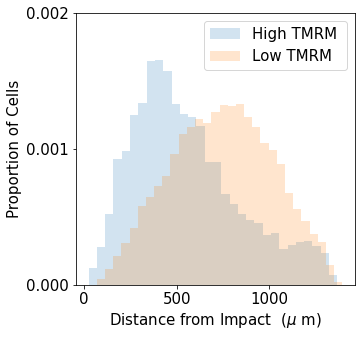

In [160]:

plt.figure(figsize=(5,5))
plt.hist(x_mt_2,30,alpha = 0.2,density=True,label='High TMRM ')
plt.hist(x_mt_1,30,alpha = 0.2,density=True,label='Low TMRM ')
plt.yticks([0,0.001,0.002])
plt.xlabel('Distance from Impact  ($\mu$ m)')
plt.ylabel('Proportion of Cells')
plt.legend()



In [161]:
import scipy.stats
scipy.stats.ks_2samp(x_mt_1,x_mt_2)


KstestResult(statistic=0.3118381117123139, pvalue=1.433045791947595e-268)